In [ ]:
#Mounting google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# 🐕 Multiclass Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and Tensorflow hub.

## 1. Problem

Identifying the breed of dog given an image of dog.

When I take a photo of a dog, I want to know what breed it is.

## 2. Data

Data we will be using is from Kaggle - Dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image

Evaluation metric - Multi class Log Loss

## 4. Features

* We're dealing with unstructured data (images) so we will be using deep learning\transfer learning
* There are 120 breeds of dogs (classes)
* There are 10K+ images in training and test sets.

In [ ]:
#Unziping our uploaded data into Google Drive
#!unzip "/content/drive/MyDrive/dog_breed_classification/dog-breed-identification.zip" -d "/content/drive/MyDrive/dog_breed_classification/"

## Getting our workspace ready

In [1]:
# Import TensorFlow
import tensorflow as tf
print("TF version :",tf.__version__)

# Import Tensorflow Hub
import tensorflow_hub as hub
print("TF Hub version :",hub.__version__)

# Check for GPU availability
print("GPU","Available" if tf.config.list_physical_devices("GPU") else "not available")

# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import seaborn as sns
import os
from sklearn.model_selection import train_test_split
plt.style.use('bmh')

TF version : 2.12.0
TF Hub version : 0.14.0
GPU Available


## Getting our data ready (turning into tensors)

Tensors are numerical representations and we need to work with numerical format data in machine learning

In [2]:
# Checkout the labels of our data
labels = pd.read_csv('/content/drive/MyDrive/dog_breed_classification/labels.csv')
print(labels.info())
print(labels.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB
None
                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [3]:
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


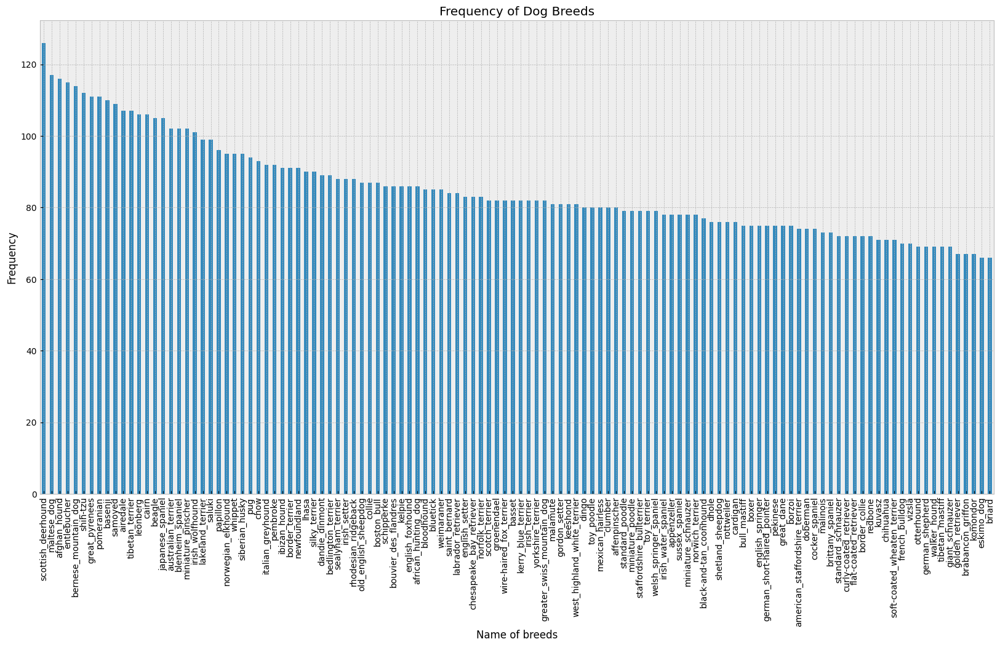

In [4]:
labels['breed'].value_counts().plot.bar(figsize=(20,10))
plt.ylabel('Frequency')
plt.xlabel('Name of breeds')
plt.title("Frequency of Dog Breeds");

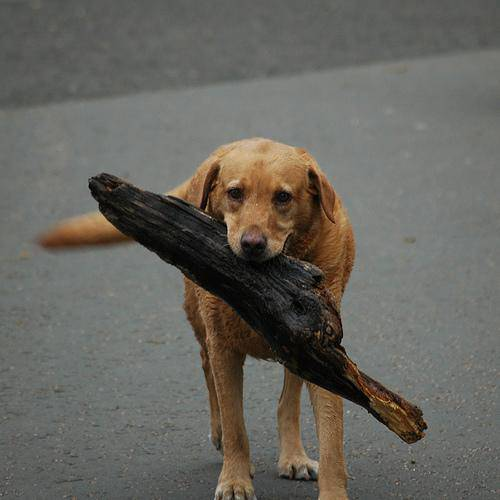

In [5]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/dog_breed_classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

## Getting images and their labels
Let's get a list of all our image file pathnames.

In [6]:
#Create pathnames for image id
filenames = ["/content/drive/MyDrive/dog_breed_classification/train/"+fname+".jpg" for fname in labels["id"]]

#Check for first 5
filenames[:5]

['/content/drive/MyDrive/dog_breed_classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog_breed_classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog_breed_classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog_breed_classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog_breed_classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [7]:
# Check whether no. of filenames matches actual image files
if len(os.listdir("/content/drive/MyDrive/dog_breed_classification/train/")) == len(filenames):
  print("Filenames match actual amount of files ! PROCEED.")
else:
  print("Filenames donot match actual amount of files, check target dictionary")

Filenames match actual amount of files ! PROCEED.


Since we've got our training data image path in a list, let's prepare labels

In [8]:
breeds = labels["breed"].to_numpy()
breeds

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [9]:
# See if no. of labels matches no. of filenames
if len(breeds)==len(filenames):
  print("No. of breeds matches no. of filenames!")
else:
  print("No. of breeds do not match no. of filenames!")

No. of breeds matches no. of filenames!


In [10]:
# Find the unique breed values
unique_breeds = np.unique(breeds)
print("No. of unique breeds are",len(unique_breeds))

No. of unique breeds are 120


In [11]:
# Turn every breed into a boolean array
boolean_labels = [breed == unique_breeds for breed in breeds]
boolean_labels[:1]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False])]

### Creating our own validation set

In [12]:
# Setup X and y labels
X = filenames
y = boolean_labels

We're going to start off experimenting with ~ 1000 images and increase as needed

In [13]:
# Set up no. of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10222}

In [14]:
# Let's split our data into train and validation datasets
x_train,x_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [15]:
# Let's look at training data
x_train[:2],y_train[:2]

(['/content/drive/MyDrive/dog_breed_classification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog_breed_classification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,

## Preprocessing Images (into Tensors)
To preprocess our images into Tensors we're going to write a function which dies a few things
1. Take an image pathfile as input
2. Use tensorflow to read the file and save it as a variable 'image'
3. Turn our 'image' (a jpg) into Tensors
4. Normalize our image (convert from 0-255 to 0-1)
5. Resize the 'image' to be a shape of (224,224)
6. Return the modified 'image'

In [16]:
# Before we start let us see what Tensors look like
image = imread(filenames[7])
image.shape

(227, 231, 3)

In [17]:
image.max(), image.min()

(255, 0)

In [18]:
#Turn images into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 231, 3), dtype=uint8, numpy=
array([[[ 76,  97,  58],
        [ 80, 101,  62],
        [ 84, 104,  67],
        ...,
        [ 67,  82,  51],
        [ 67,  82,  51],
        [ 37,  52,  19]],

       [[ 91, 112,  73],
        [ 94, 115,  76],
        [ 93, 113,  76],
        ...,
        [ 89, 102,  74],
        [ 83,  96,  66],
        [ 71,  84,  54]]], dtype=uint8)>

In [19]:
# Define Image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path,img_size=IMG_SIZE):
  """ Takes an image file path and turns the image into a Tensor. """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn jpeg image into numerical tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)

  # Convert the channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)

  # Resize our image to desired value (IMG_SIZE)
  image = tf.image.resize(image,size=[img_size,img_size])

  return image

## Turning our data into batches
Why turn our data into batches?

Let's say you are trying to process 10K+ images in 1 go... they might not fit into memory

So we will make batches of 32 images at a time.

In order to use Tensorflow effectively, we need our data in the form of Tensor tuples which look like this:
`(image,label)`.

In [20]:
# Create a function to return a tuple (image,label)
def get_image_label(image_path,label):
  ''' Takes an image path name and associated label, processes the image and returns a tuple (image,label)'''
  image = process_image(image_path)
  return image,label

Now we've got a way to turn our data into tuples of Tensors in the form `(image,label)`, let's make a function to turn all our data (X & y) into batches!

In [21]:
# Define the batch size
BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=None, test_data=False):
  ''' Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle the validation data.
  Also accepts test data as input (no labels)'''

  #IF TEST DATA, NO LABELS
  if test_data:
    print('Creating test dataset batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If data is a validation data set, we don't need to shuffle it
  elif valid_data:
    print('Creating validation dataset batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print('Creating training data batches...')
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image,label) tuples ( also turns image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn training data into batches
    data_batch = data.batch(batch_size)
    return data_batch


In [22]:
# Create training and validation data batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val,y_val, valid_data = True)

Creating training data batches...
Creating validation dataset batches...


In [23]:
# Check out different attributes of data batches
train_data.element_spec , val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however these can be a little hard to understand, Let's visualize them

In [24]:
# Create a function for viewing images
def show_images(images,labels):
  ''' Displays a plot of 25 images and their labels from a data batch'''
  # Setup the figure
  plt.figure(figsize=(15,10))

  # Loop through 25 images
  for i in range(25):
    # Create subplots ( 5 rowss, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display image
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

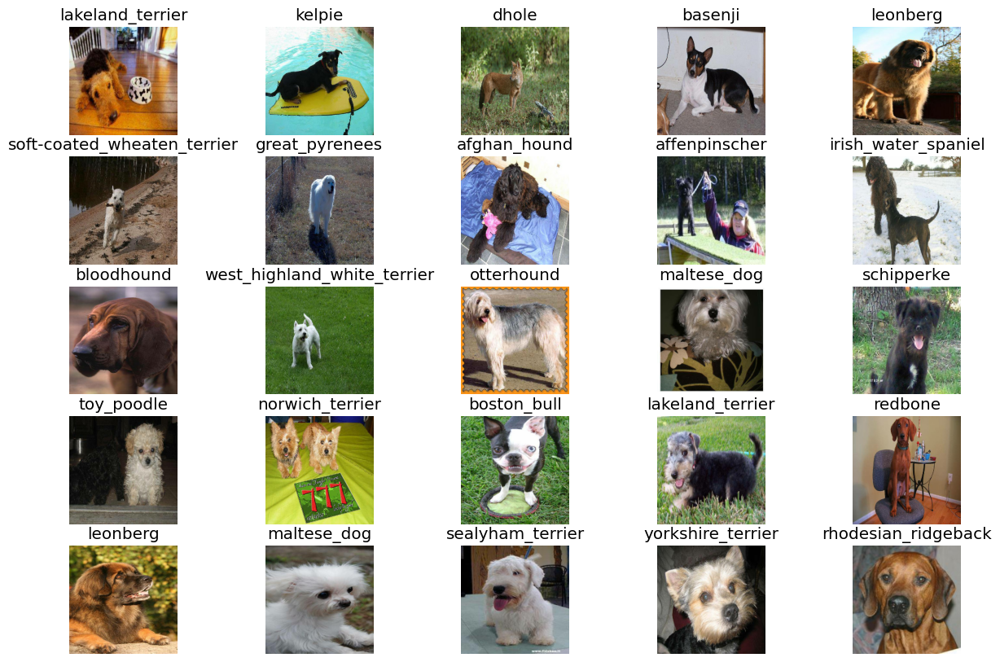

In [25]:
# Now let's visualize our data in training set
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

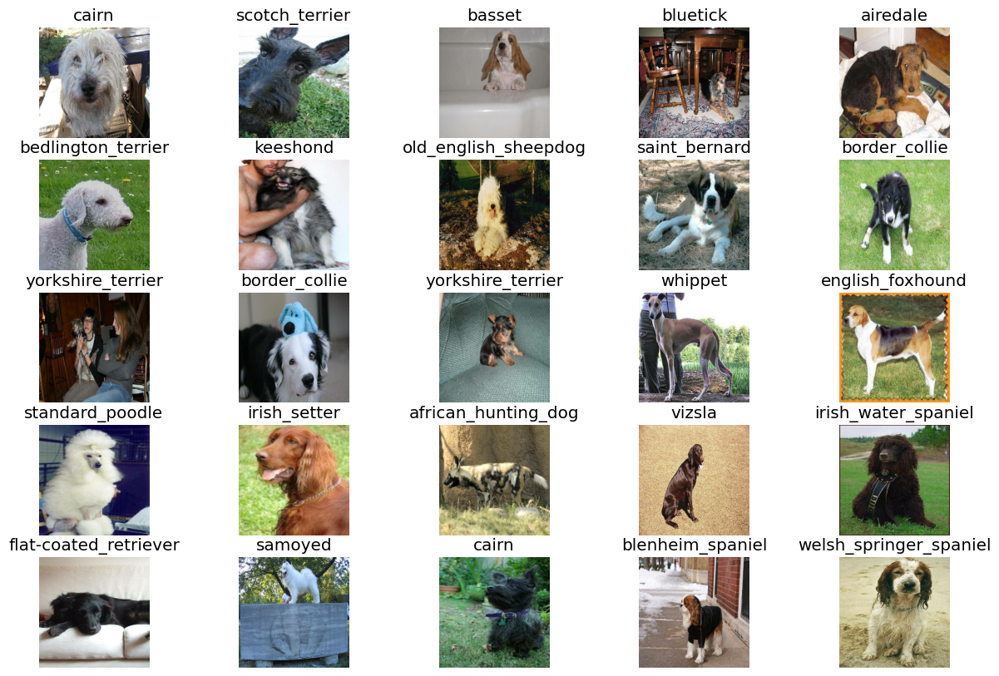

In [26]:
# Now let's visualize our validation dataset
val_images, val_labels = next(val_data.as_numpy_iterator())
show_images(val_images,val_labels)

## Building our model
Before we build a model, there are a few things we need to define
*  Input shape (our images shape in form of Tensors) to our model
* Output shape (image labels, in form of tensors) to our model
* URL of model we want to use from TensorFlow Hub (https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5)

In [27]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

Now we've got our inputs outputs and model ready to go.
Let's put them together into a Keras deep learning model

Knowing this, Let us create a function which:
* Takes input shape, output shape and the model we've chosen as parameters.
* Defines layers in Keras model, in sequential fashion
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model

In [28]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape= OUTPUT_SHAPE, model_url = MODEL_URL):
  ''' Returns a keras deep leaning model to be used in our project'''
  print(' Building model with :',model_url)

  # Setup keras layers
  model = tf.keras.Sequential([
      hub.KerasLayer(model_url), # Layer 1 (input layer)
      tf.keras.layers.Dense(units= output_shape, activation = "softmax") #Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(loss = tf.losses.CategoricalCrossentropy(),
                optimizer = tf.keras.optimizers.Adam(),
                metrics = ["accuracy"])
  # Build the model
  model.build(input_shape)

  return model

In [29]:
model = create_model()
model.summary()

 Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions that a model can use during training to do such things like save it's progress, check it's progress or stop training early if a model stops improving.

We'll create 2 callbacks
1. Tensorboard : help track model's progress
2. Early stopping : Prevents model from training too long.

### TensorBoard Callback
We need to to 3 things
1. Load TensorBoard Notebook extension
2. Create TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we''ll do this after our model training).

In [30]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [31]:
import datetime

# Create a function to build a TensorFlow callback
def create_tensorboard_callback():
  #Create a lof directory for storing Tensorboard logs
  logdir = os.path.join('/content/drive/MyDrive/dog_breed_classification/Logs',
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))

  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callbacks
Early stopping helps our model from overfitting by stopping training if a certain evaluation metric stops improving

In [32]:
# Create earlystopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_loss",patience=3)

## Training our model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [33]:
NUM_EPOCHS = 100 #@param {type:'slider',min:10,max:100}

Let's create a function that trains a model

* Create a model using `create_model`
* Setup TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training , validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [34]:
# Build a fucntion to train and return trained model
def train_model():
  ''' Trains a given model and returns the trained model '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to data passing callbacks we created
  model.fit(x = train_data,
             epochs = NUM_EPOCHS,
             validation_data = val_data,
             validation_freq = 1,
             callbacks = [tensorboard,early_stopping])

  # Return the model
  return model

In [35]:
# Fit our model to the data
model = train_model()

 Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 159s 4s/step - loss: 4.4231 - accuracy: 0.1088 - val_loss: 3.4117 - val_accuracy: 0.2750
Epoch 2/100
25/25 [==============================] - 4s 156ms/step - loss: 1.5605 - accuracy: 0.7175 - val_loss: 2.1485 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5474 - accuracy: 0.9400 - val_loss: 1.6907 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 170ms/step - loss: 0.2476 - accuracy: 0.9862 - val_loss: 1.5124 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 5s 184ms/step - loss: 0.1455 - accuracy: 0.9975 - val_loss: 1.4227 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 3s 130ms/step - loss: 0.0982 - accuracy: 0.9987 - val_loss: 1.3767 - val_accuracy: 0.6400
Epoch 7/100
25/25 [=============================

## Checking the TensorBoard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [36]:
%tensorboard --logdir /content/drive/MyDrive/dog_breed_classification/Logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using trained model

In [37]:
# Make predictions on the validation data
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 107ms/step


array([[2.66244606e-04, 1.79750496e-05, 1.07388769e-04, ...,
        1.16200463e-04, 1.21679113e-05, 1.20482617e-03],
       [1.41240633e-03, 4.92582098e-04, 3.67241492e-03, ...,
        1.04899540e-04, 2.47972057e-04, 1.77308335e-04],
       [2.87727039e-06, 1.60015964e-06, 4.22392588e-07, ...,
        2.14751944e-05, 4.07165680e-06, 5.79590851e-05],
       ...,
       [1.27671001e-07, 4.89049262e-06, 1.03800403e-06, ...,
        3.36359307e-07, 1.60194431e-05, 2.51040228e-06],
       [1.00302033e-03, 5.98689439e-05, 9.10763993e-06, ...,
        7.89348924e-05, 1.69235209e-05, 3.19637405e-03],
       [1.02691105e-04, 1.21599612e-06, 1.31837628e-03, ...,
        3.80007143e-04, 6.94635441e-04, 5.63805497e-06]], dtype=float32)

In [38]:
print('No. of predictions , unique breeds matrix')
print(predictions.shape)

No. of predictions , unique breeds matrix
(200, 120)


In [39]:
# First prediction
index=42
#print(predictions[index])
print('Max value (probability of predictions) :',np.max(predictions[index]))
print('Sum :',np.sum(predictions[index]))
print('Max index :',np.argmax(predictions[index]))
print('Predicted label :',unique_breeds[np.argmax(predictions[index])])

Max value (probability of predictions) : 0.64963907
Sum : 1.0
Max index : 113
Predicted label : walker_hound


Having the above functionality is great but we want to be able to do it at scale

And it would be even better if we could see the image the prediction is being made on!

**Note!** Prediction probabilities are also known as confidence labels.

In [40]:
# Turns prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  ''' Getting prediction probabilities into a label '''
  return unique_breeds[np.argmax(prediction_probabilities)]

Now since our validation data is still in a batch dataset, We'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)

In [41]:
# Create a function to unbatch validation data
def unbatchify(data):
  ''' Takes a dataset of (image,label) Tensors and returns seperate arrays of images and labels '''
  images,labels = [],[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [42]:
val_images,val_labels = unbatchify(val_data)

Now we've got ways to get:
* Validation images
* Validation labels (truth labels)
* Predicted labels

Let's make a function to make all these a bit more visualized.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
* Convert the prediction probabilities into a predicted label
* Plot the predicted label and it's predicted probability, the truth label and the target image on a single plot.

In [43]:
def plot_preds(prediction_probabilities,labels,images,n=1):
  ''' View prediction, truth and image for sample n '''
  pred_prob,true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of title depending on if prediction is right or wrong
  if pred_label == true_label:
    color='green'
  else:
    color='red'
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),color=color)

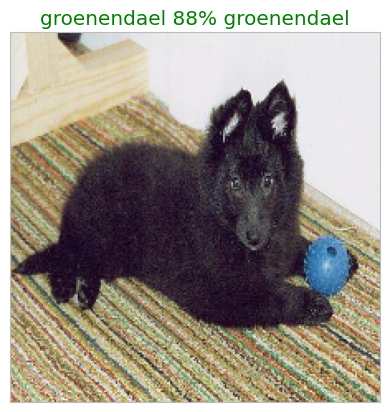

In [44]:
plot_preds(prediction_probabilities=predictions,
           images=val_images, labels=val_labels,n=77)

  Now we've got a function to visualize our model's top predictions, let's make another function to view our models top 10 predictions.

  This function will:
  *Take an input of prediction probabilties array and truth array and an integer
  *Find the prediction using `get_pred_label()`
  * Find top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
  * Plot top 10 prediction probability values and labels, colouring the true labels green and false labels red

In [45]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  ''' Returns the top 10 highest prediction confidences along with truth label for a sample n. '''
  pred_prob, true_label = prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # FIND top 10 prediction confidence indees
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find value in top 10 predictions
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                                top_10_pred_values, color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,
             rotation='vertical')
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

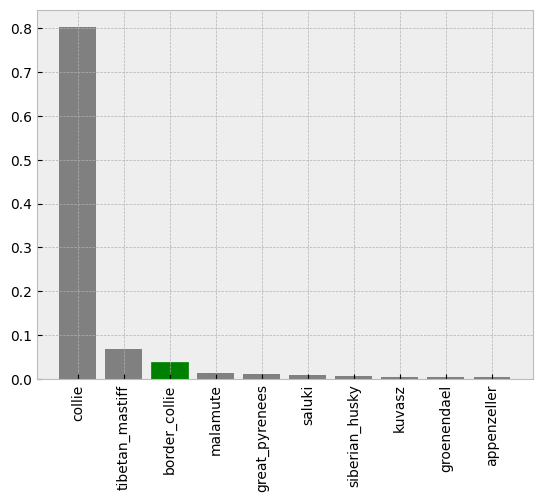

In [46]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

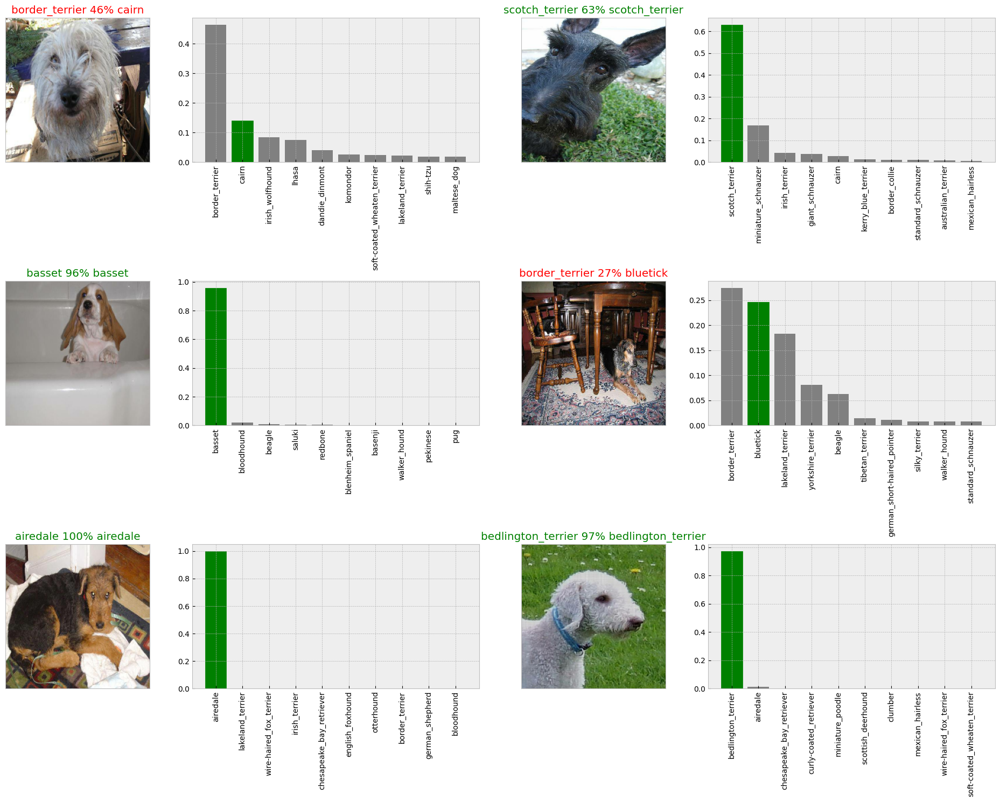

In [48]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_preds(prediction_probabilities=predictions, labels=val_labels,
             images= val_images, n = i+i_multiplier)

  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities= predictions, labels=val_labels, n = i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model

In [52]:
# Create a function to save a model
def save_model(model, suffix=None):
  ''' Saves a given model in a model's directory and appends a suffix (string).'''

  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/dog_breed_classification/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print("Saving model to :",model_path,"....")
  model.save(model_path)
  return model_path

In [53]:
# Create a function to load a saved model
def load_model(model_path):
  ''' Loads a saved model from a specified path'''
  print("Loading saved model from :",model_path)
  model = tf.keras.models.load_model(model_path,
                                     custom_objects= {'KerasLayer':hub.KerasLayer})
  return model

Now we've got functions to save and load a model, let's make sure they work

In [54]:
# Save our model on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-adam')

Saving model to : /content/drive/MyDrive/dog_breed_classification/Models/20230729-19161690658211-1000-images-mobilenetv2-adam.h5 ....


'/content/drive/MyDrive/dog_breed_classification/Models/20230729-19161690658211-1000-images-mobilenetv2-adam.h5'

In [55]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/dog_breed_classification/Models/20230729-19161690658211-1000-images-mobilenetv2-adam.h5')

Loading saved model from : /content/drive/MyDrive/dog_breed_classification/Models/20230729-19161690658211-1000-images-mobilenetv2-adam.h5


In [56]:
# Evaluate the pre-saved-model
model.evaluate(val_data)

7/7 [==============================] - 1s 182ms/step - loss: 1.1866 - accuracy: 0.6950


[1.1866317987442017, 0.6949999928474426]

In [58]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 142ms/step - loss: 1.1866 - accuracy: 0.6950


[1.1866317987442017, 0.6949999928474426]

## Training a big dog model (on full data)

In [59]:
# Create a databatch with full dataset
full_data = create_data_batches(X,y)

Creating training data batches...


In [60]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
# Create a model for full dataset
full_model = create_model()

 Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [65]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

**Note** Running the cell below will take a while as GPU will have to load all images into memory

In [66]:
# Fit the full model to full data
full_model.fit(x=full_data,
              epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 48s 149ms/step - loss: 0.1989 - accuracy: 0.9475
Epoch 2/100
320/320 [==============================] - 40s 123ms/step - loss: 0.1294 - accuracy: 0.9708
Epoch 3/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0897 - accuracy: 0.9812
Epoch 4/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0663 - accuracy: 0.9888
Epoch 5/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0513 - accuracy: 0.9932
Epoch 6/100
320/320 [==============================] - 37s 114ms/step - loss: 0.0405 - accuracy: 0.9950
Epoch 7/100
320/320 [==============================] - 38s 120ms/step - loss: 0.0335 - accuracy: 0.9972
Epoch 8/100
320/320 [==============================] - 39s 121ms/step - loss: 0.0282 - accuracy: 0.9972
Epoch 9/100
320/320 [==============================] - 37s 115ms/step - loss: 0.0241 - accuracy: 0.9979
Epoch 10/100
320/320 [==============================] - 38s 119m

In [67]:
# Saving the above model
save_model(full_model,suffix='full_imageset_mobilenetv2-Adam')

Saving model to : /content/drive/MyDrive/dog_breed_classification/Models/20230729-19471690660069-full_imageset_mobilenetv2-Adam.h5 ....


'/content/drive/MyDrive/dog_breed_classification/Models/20230729-19471690660069-full_imageset_mobilenetv2-Adam.h5'

In [68]:
# Loading the saved full model
loaded_full_model = load_model('/content/drive/MyDrive/dog_breed_classification/Models/20230729-19471690660069-full_imageset_mobilenetv2-Adam.h5')

Loading saved model from : /content/drive/MyDrive/dog_breed_classification/Models/20230729-19471690660069-full_imageset_mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor Batches, to make predictions on the test data, we'll have to get it into the same format

To make predictions on test data we'll:
* Get test image filenames
* Convert filenames into dataset batches
* Make predictions array by passing test batches to the `predict()` method called on our model

In [70]:
# Load test image filenames
test_path = '/content/drive/MyDrive/dog_breed_classification/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:3]

['/content/drive/MyDrive/dog_breed_classification/test/dfc0659b3b6eff35dc50d2501f1ea247.jpg',
 '/content/drive/MyDrive/dog_breed_classification/test/e3a55cc9c91da472abbced51d98d6ff6.jpg',
 '/content/drive/MyDrive/dog_breed_classification/test/de9fc145601771b7a5b7e68822416fb5.jpg']

In [71]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test dataset batches...


In [72]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [73]:
# Make predictions on test databatch using the loaded model
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 3821s 12s/step


In [74]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/dog_breed_classification/predictions.csv',test_predictions,delimiter=',')

In [75]:
# Load predictions (Numpy Array) from csv file
test_predicted = np.loadtxt('/content/drive/MyDrive/dog_breed_classification/predictions.csv',delimiter=',')

In [76]:
test_predicted[:5]

array([[9.97667726e-10, 4.38221281e-09, 4.59405708e-11, 1.26892114e-02,
        6.47660904e-03, 7.84989353e-03, 1.13905314e-03, 6.49983747e-07,
        1.28035765e-07, 1.33945878e-05, 2.41604653e-10, 1.05279446e-06,
        5.01051909e-05, 3.56930627e-08, 2.39096948e-07, 4.60888623e-05,
        1.14721885e-08, 2.27589851e-07, 1.93736973e-08, 3.85660321e-08,
        5.69195767e-11, 8.33951841e-09, 2.90196761e-03, 4.23972990e-09,
        3.50224695e-06, 2.29100294e-07, 4.23556670e-13, 3.56108529e-08,
        1.51269933e-06, 9.02363183e-07, 2.33673359e-06, 2.13252989e-08,
        1.98536844e-04, 2.12581926e-06, 9.43579792e-08, 6.96858081e-07,
        3.29029776e-10, 3.94847234e-07, 1.70498583e-02, 1.93266583e-10,
        7.10224279e-09, 1.46542449e-08, 5.78731961e-05, 1.91140153e-08,
        6.17151591e-06, 3.35094335e-08, 5.02208650e-07, 9.08217928e-08,
        2.18348182e-03, 3.61085722e-06, 4.13928255e-02, 2.41206832e-10,
        1.99179362e-06, 1.18378000e-06, 7.42777431e-08, 1.184110

## Preparing test dataset predictions for kaggle

In [77]:
# Create a pandas dataFrame with empty columns
preds_df = pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [80]:
# Append test image ids to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfc0659b3b6eff35dc50d2501f1ea247,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3a55cc9c91da472abbced51d98d6ff6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,de9fc145601771b7a5b7e68822416fb5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e2a6dfb8127f801af0626f245f35441e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1fa4eb8a57184773ac11efe0de11e92,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,08ffbdb8c2abc705348260533f3a0659,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,083ee6a9bf4958f0acb86ffe3e5aefff,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,073b0f066231ef6c0b2a0e1142dae338,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,077b4fc2385787eaad45dafe0a7a1a20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
# Add prediction probabilities to each dog breed ids
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,dfc0659b3b6eff35dc50d2501f1ea247,9.976677e-10,4.382213e-09,4.594057e-11,1.268921e-02,6.476609e-03,7.849894e-03,1.139053e-03,6.499837e-07,1.280358e-07,...,6.048700e-07,1.095360e-05,4.186523e-06,4.086320e-05,1.214534e-07,2.716628e-05,2.247734e-07,4.671909e-10,2.758689e-08,3.941534e-04
1,e3a55cc9c91da472abbced51d98d6ff6,2.521096e-08,1.873809e-08,5.072254e-07,5.646317e-10,2.959302e-11,1.939152e-11,6.481144e-10,4.200254e-10,1.602000e-10,...,2.557634e-08,2.256775e-10,2.286576e-10,4.733590e-11,1.686844e-08,4.972741e-12,4.253569e-10,7.439142e-12,5.638974e-11,2.652846e-09
2,de9fc145601771b7a5b7e68822416fb5,8.901123e-13,1.385541e-09,2.300257e-12,1.921481e-09,3.671139e-09,8.278459e-08,2.516243e-09,3.376469e-07,9.945427e-07,...,1.057856e-10,5.405999e-12,5.973889e-06,2.607375e-05,2.428638e-08,1.739896e-08,7.414688e-13,9.627572e-08,1.476523e-08,2.368737e-10
3,e2a6dfb8127f801af0626f245f35441e,1.721541e-07,5.949160e-05,8.782943e-09,4.961677e-05,8.407256e-07,1.403259e-07,4.782289e-06,1.315536e-04,1.137522e-07,...,1.092879e-06,4.844017e-06,3.025320e-07,1.669031e-04,1.118827e-04,7.838575e-04,5.739847e-03,7.708067e-06,1.944196e-01,8.494718e-05
4,e1fa4eb8a57184773ac11efe0de11e92,2.033216e-07,6.417312e-09,1.058059e-07,2.386358e-09,8.757855e-12,1.499981e-10,2.349579e-10,1.641908e-10,7.969272e-11,...,8.326956e-08,2.707105e-10,3.699495e-11,8.180290e-11,3.664121e-12,5.450144e-10,2.082039e-08,2.234756e-10,3.203740e-08,7.185874e-08


In [82]:
preds_df.to_csv('/content/drive/MyDrive/dog_breed_classification/submission_mobilenetv2.csv',index=False)